In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
matplotlib.rcParams['axes.titlesize'] = 20
%matplotlib inline
matplotlib.rcParams['image.cmap'] = 'gray'

# <font style="color:rgb(50,120,229)">Brightness Enhancement</font>
Brightness is a measure of light falling on the scene. In RGB color space, it can be thought of as the arithmetic mean of the R, G and B color values. To make an image brighter, the intensity values should be increased by some offset ( $\beta$ ) and vice-versa.

If  𝐼
  is the input image, and $I_o$
  is the output image, brightness enhanced image is given by the equation

$$
I_o = I + \beta
$$

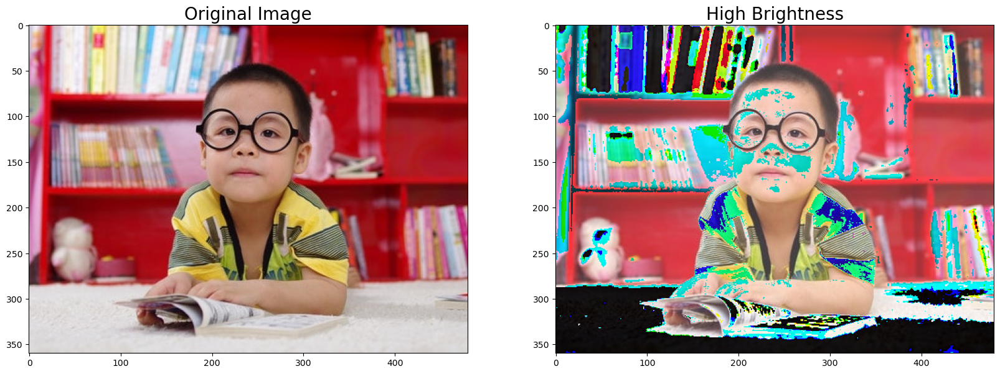

In [ ]:
# Read image
image = cv2.imread("boy.jpg")
brightnessOffset = 50
brightHigh = image + brightnessOffset
# Display the outputs

plt.figure(figsize=[20,20])
plt.subplot(121);plt.imshow(image[...,::-1]);plt.title("Original Image");
plt.subplot(122);plt.imshow(brightHigh[...,::-1]);plt.title("High Brightness");

# <font style="color:rgb(50,120,229)">Contrast Enhancement</font>
The highest pixel intensity in the original image is **255**. Since we have added **50** to each pixel, the highest pixel intensity in brightHigh image should have been **305**. But we can see that the highest pixel intensity is in brightHigh image is **255**.

This is happening because of the **uint8** datatype. Since the maximum value that a unsigned 8 bit integer can hold is 255, any value greater than that is causing an **overflow**.



In [ ]:
print("Original Image Datatype : {}".format(image.dtype))
print("Brightness Image Datatype : {}\n".format(brightHigh.dtype))

print("Original Image Highest Pixel Intensity : {}".format(image.max()))
print("Brightness Image Highest Pixel Intensity : {}".format(brightHigh.max()))


Original Image Datatype : uint8
Brightness Image Datatype : uint8

Original Image Highest Pixel Intensity : 255
Brightness Image Highest Pixel Intensity : 255


In [ ]:
# Sample 2x2 matrix of type uint8
a = np.array([[100, 110],
              [120, 130]], dtype='uint8')
print(a)

[[100 110]
 [120 130]]


In [ ]:
# Add 130 so that the last element encounters overflow
print(a + 130)

[[230 240]
 [250   4]]


### <font style="color:rgb(8,133,37)">Solution </font>
use opencv to handle uint8 arithmetic
**or** convert to higher integer types to avoid overflow and Perform clipping if necessary and bring it back to uint8 in the final stage as that is what the display functions expect.

### <font style="color:rgb(8,133,37)">Solution 1 : Use opencv functions</font>

In [ ]:
print(cv2.add(a,130))

[[230 240]
 [250 255]]


### <font style="color:rgb(8,133,37)">Solution 2 : Convert to int32/int64</font>

In [ ]:
a_int32 = np.int32(a)
b = a_int32+130
print(b)

[[230 240]
 [250 260]]


In [ ]:
b=b.clip(0,255)
b_uint8 = np.uint8(b)
b_uint8

array([[230, 240],
       [250, 255]], dtype=uint8)

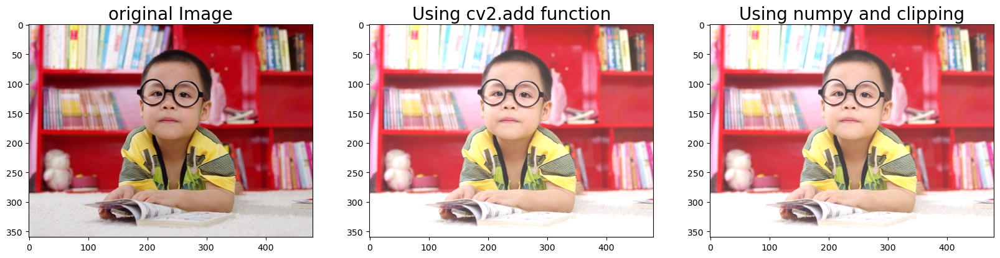

In [ ]:
brightnessOffset = 50

# Add the offset for increasing brightness
brightHighOpenCV = cv2.add(image, np.ones(image.shape,dtype='uint8')*brightnessOffset)

brightHighInt32 = np.int32(image) + brightnessOffset
brightHighInt32Clipped = np.clip(brightHighInt32,0,255)

plt.figure(figsize=[20,20])
plt.subplot(131);plt.imshow(image[...,::-1]);plt.title("original Image");
plt.subplot(132);plt.imshow(brightHighOpenCV[...,::-1]);plt.title("Using cv2.add function");
plt.subplot(133);plt.imshow(brightHighInt32Clipped[...,::-1]);plt.title("Using numpy and clipping");

## <font style="color:rgb(50,120,229)">Contrast Enhancement</font>


In the code below, we will apply this formula:
 $$
 I_o = \alpha I
 $$
    
to get contrast enhanced images and the contrast will increase by 30%

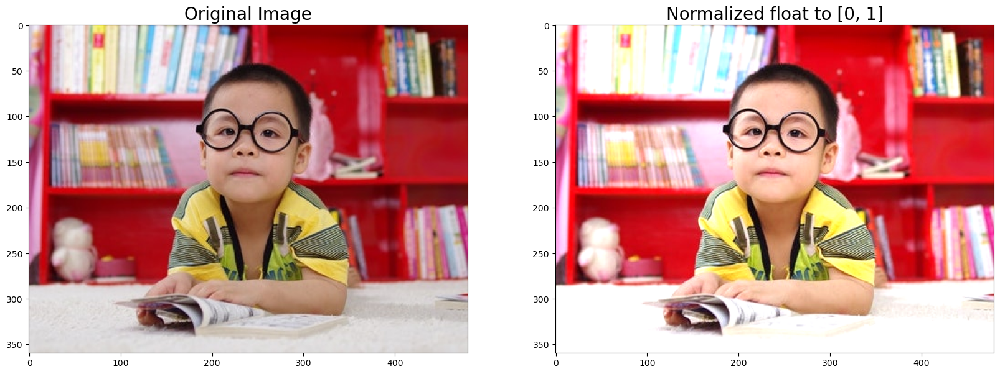

In [ ]:
contrastPercentage = 30

# Multiply with scaling factor to increase contrast
contrastHighNormalized = (image * (1+contrastPercentage/100))/255
contrastHighNormalized01Clipped = np.clip(contrastHighNormalized,0,1)

# Display the outputs
plt.figure(figsize=[20,20])
plt.subplot(121);plt.imshow(image[...,::-1]);plt.title("Original Image");
plt.subplot(122);plt.imshow(contrastHighNormalized01Clipped[...,::-1]);plt.title("Normalized float to [0, 1]");

# <font style="color:rgb(50,120,229)">Histogram Equalization for Grayscale Images</font>

(-0.5, 541.5, 749.5, -0.5)

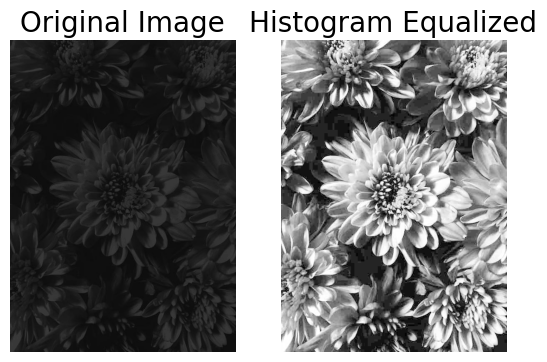

In [ ]:
# Read image in grayscale format
im = cv2.imread("dark-flowers.jpg", cv2.IMREAD_GRAYSCALE)
# Equalize histogram
imEq = cv2.equalizeHist(im)
#Display images
plt.figure()
ax = plt.subplot(1,2,1)
plt.imshow(im, vmin=0, vmax=255)
ax.set_title("Original Image")
ax.axis('off')
ax = plt.subplot(1,2,2)
plt.imshow(imEq, vmin=0, vmax=255)
ax.set_title("Histogram Equalized")
ax.axis('off')

### <font style = "color:rgb(8,133,37)">Display Histogram</font>

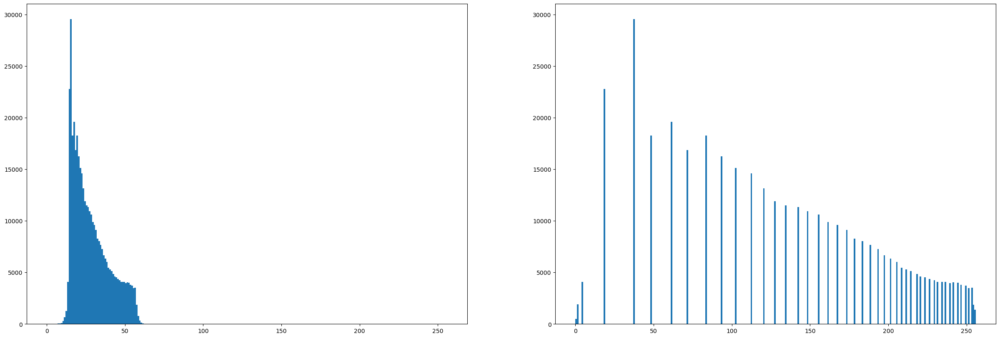

In [ ]:
plt.figure(figsize=(30,10))
plt.subplot(1,2,1)
plt.hist(im.ravel(),256,[0,256]);

plt.subplot(1,2,2)
plt.hist(imEq.ravel(),256,[0,256]);
plt.show()


# <font style="color:rgb(50,120,229)">Histogram Equalization for Color Images</font>

we can simply perform histogram equalization for each channel separately.

### <font style="color:rgb(8,133,37)">Wrong Way</font>

(-0.5, 541.5, 749.5, -0.5)

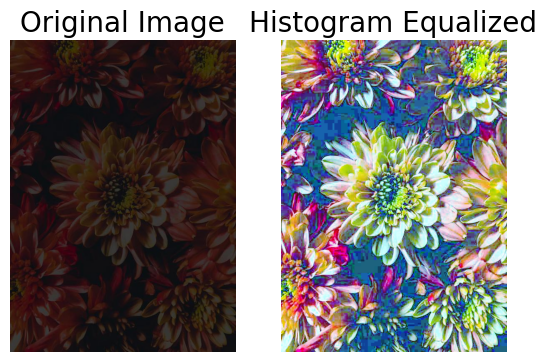

In [ ]:
im = cv2.imread("dark-flowers.jpg")
imEq = np.zeros_like(im)

# Peform histogram equalization on each channel separately
for i in range(0,3):
    imEq[:,:,i] = cv2.equalizeHist(im[:,:,i])

#Display images
plt.figure()

ax = plt.subplot(1,2,1)
plt.imshow(im[:,:,::-1], vmin=0, vmax=255)
ax.set_title("Original Image")
ax.axis('off')


ax = plt.subplot(1,2,2)
plt.imshow(imEq[:,:,::-1], vmin=0, vmax=255)
ax.set_title("Histogram Equalized")
ax.axis('off')


### <font style="color:rgb(8,133,37)">Right Way</font>

We just saw that histogram equalization performed on the three channels separately leads to a bad results. The reason is that when each color channel is non-linearly transformed independently, you can get completely new and unrelated colors.

The right way to perform histogram equalization on color images is to transform the images to a space like the **HSV** .

These are the steps involved

1. Tranform the image to HSV colorspace.
2. Perform histogram equalization only on the V channel.
3. Transform the image back to RGB colorspace.



(-0.5, 541.5, 749.5, -0.5)

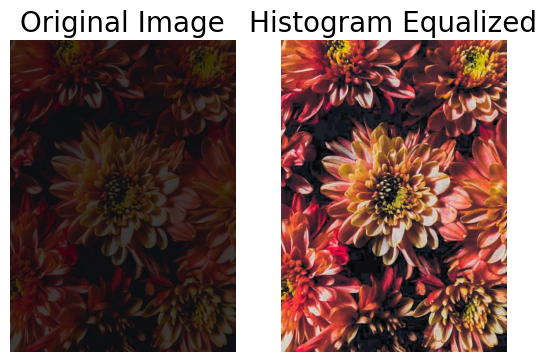

In [ ]:
im = cv2.imread("dark-flowers.jpg")

# Convert to HSV
imhsv = cv2.cvtColor(im, cv2.COLOR_BGR2HSV)

# Perform histogram equalization only on the V channel
imhsv[:,:,2] = cv2.equalizeHist(imhsv[:,:,2])

# Convert back to BGR format
imEq = cv2.cvtColor(imhsv, cv2.COLOR_HSV2BGR)

#Display images
plt.figure()

ax = plt.subplot(1,2,1)
plt.imshow(im[:,:,::-1], vmin=0, vmax=255)
ax.set_title("Original Image")
ax.axis('off')


ax = plt.subplot(1,2,2)
plt.imshow(imEq[:,:,::-1], vmin=0, vmax=255)
ax.set_title("Histogram Equalized")
ax.axis('off')

## <font style="color:rgb(50,120,229)">Contrast Limited Adaptive Histogram Equalization (CLAHE) </font>

For such applications, we use [Contrast Limited Adaptive Histogram Equalization (CLAHE)] which improves the local contrast. More importantly it allows us to specify the size of the neighborhood that is considered "local".  


(-0.5, 666.5, 999.5, -0.5)

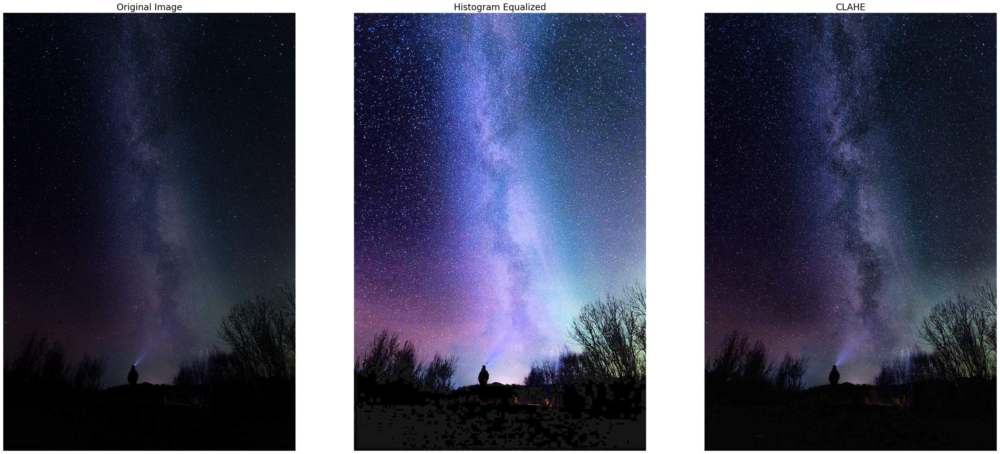

In [ ]:
im = cv2.imread("night-sky.jpg")
# Convert to HSV
imhsv = cv2.cvtColor(im, cv2.COLOR_BGR2HSV)
imhsvCLAHE = imhsv.copy()

# Perform histogram equalization only on the V channel
imhsv[:,:,2] = cv2.equalizeHist(imhsv[:,:,2])

clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
imhsvCLAHE[:,:,2] = clahe.apply(imhsvCLAHE[:,:,2])

# Convert back to BGR format
imEq = cv2.cvtColor(imhsv, cv2.COLOR_HSV2BGR)
imEqCLAHE = cv2.cvtColor(imhsvCLAHE, cv2.COLOR_HSV2BGR)

#Display images
plt.figure(figsize=(40,40))

ax = plt.subplot(1,3,1)
plt.imshow(im[:,:,::-1], vmin=0, vmax=255)
ax.set_title("Original Image")
ax.axis('off')


ax = plt.subplot(1,3,2)
plt.imshow(imEq[:,:,::-1], vmin=0, vmax=255)
ax.set_title("Histogram Equalized")
ax.axis('off')

ax = plt.subplot(1,3,3)
plt.imshow(imEqCLAHE[:,:,::-1], vmin=0, vmax=255)
ax.set_title("CLAHE")
ax.axis('off')

## <font style="color:rgb(50,120,229)">Box Filter </font>

A Box Filter is a simple averaging filter used in image processing to smooth or blur images. It works by replacing each pixel value with the average of its neighboring pixel values within a defined kernel size.



In [ ]:
img = cv2.imread("gaussian-noise.png")
dst1=cv2.blur(img,(3,3),(-1,-1))
dst2=cv2.blur(img,(7,7),(-1,-1))

Text(0.5, 1.0, 'Box Blur Result 2 : KernelSize = 7')

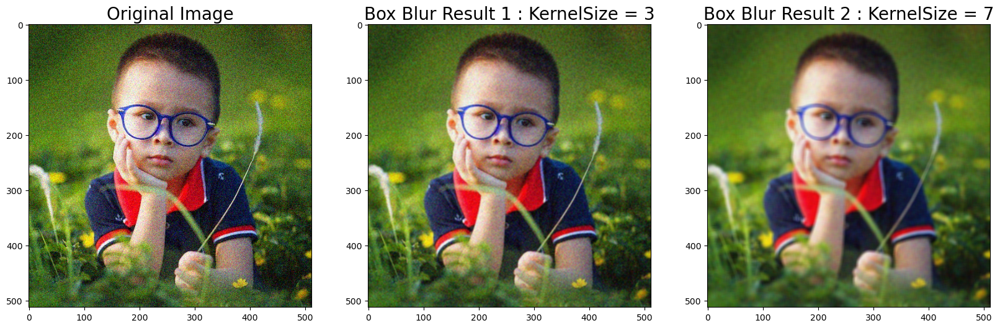

In [ ]:
plt.figure(figsize=[20,10])
plt.subplot(131);plt.imshow(img[...,::-1]);plt.title("Original Image")
plt.subplot(132);plt.imshow(dst1[...,::-1]);plt.title("Box Blur Result 1 : KernelSize = 3")
plt.subplot(133);plt.imshow(dst2[...,::-1]);plt.title("Box Blur Result 2 : KernelSize = 7")

## <font style="color:rgb(50,120,229)">Gaussian Filter</font>

A **Gaussian Filter** is a widely used smoothing technique in image processing that reduces noise while preserving edges better than a simple box filter. It applies a Gaussian function to the pixel intensities, giving more weight to pixels closer to the center.

In [ ]:
img = cv2.imread("gaussian-noise.png")
# Apply gaussian blur
dst1=cv2.GaussianBlur(img,(5,5),0,0)
dst2=cv2.GaussianBlur(img,(25,25),50,50)
# Display images
combined = np.hstack((img, dst1,dst2))

Text(0.5, 1.0, 'Gaussian Blur Result 2 : KernelSize = 25')

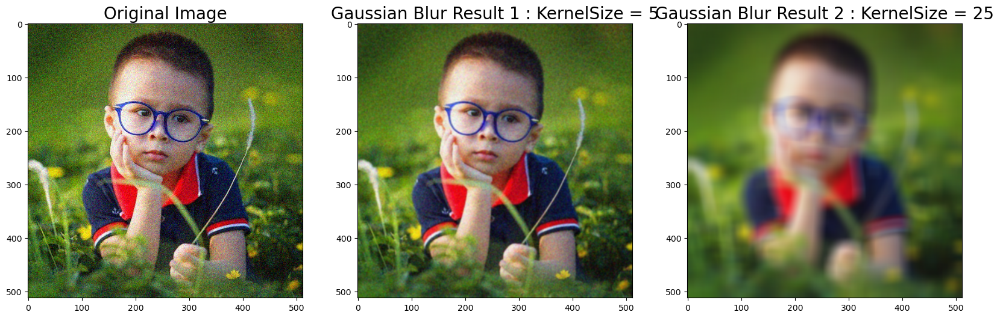

In [ ]:
plt.figure(figsize=[20,10])
plt.subplot(131);plt.imshow(img[...,::-1]);plt.title("Original Image")
plt.subplot(132);plt.imshow(dst1[...,::-1]);plt.title("Gaussian Blur Result 1 : KernelSize = 5")
plt.subplot(133);plt.imshow(dst2[...,::-1]);plt.title("Gaussian Blur Result 2 : KernelSize = 25")

# <font style="color:rgb(50,120,229)">Median Filter</font>

Median blur filtering is a nonlinear filtering technique that is most commonly used to remove **salt-and-pepper** noise from images.

Text(0.5, 1.0, 'Median Blur Result : KernelSize = 5')

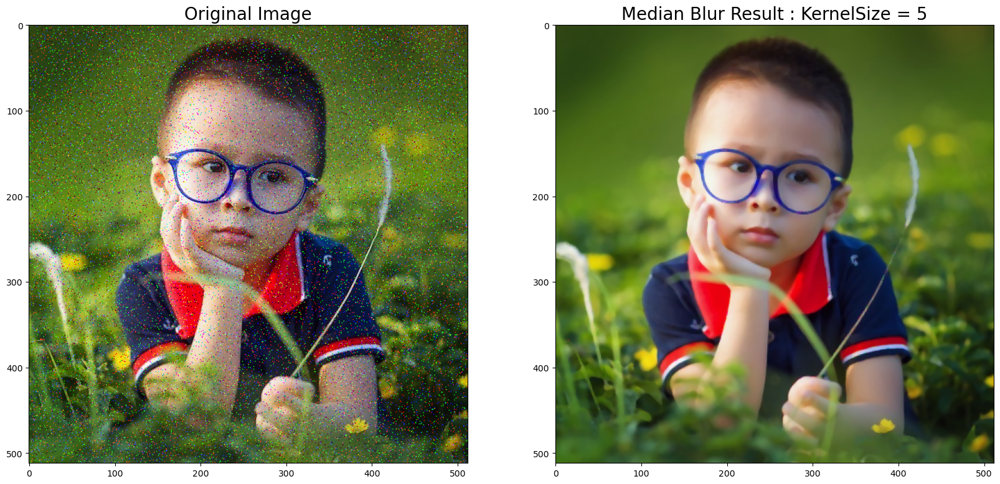

In [ ]:
img = cv2.imread("salt-and-pepper.png")

# Defining the kernel size
kernelSize = 5
# Performing Median Blurring
medianBlurred = cv2.medianBlur(img,kernelSize)

# Display the original and median blurred image
plt.figure(figsize=[20,10])
plt.subplot(121);plt.imshow(img[...,::-1]);plt.title("Original Image")
plt.subplot(122);plt.imshow(medianBlurred[...,::-1]);plt.title("Median Blur Result : KernelSize = 5")

# <font style="color:rgb(50,120,229)">Sobel Filter</font>
​
To make gradient calculations even more robust and noisefree, the image can be Gaussian-blurred slightly before applying a gradient filter.

This where the **Sobel Filters** come in. They perform Gaussian smoothing implicitly.  The Sobel filters for X Gradient and Y Gradient calculations are shown below.
​
$$
\begin{bmatrix}
-1 & 0 & 1\\
-2 & 0 & 2\\
-1 & 0 & 1
\end{bmatrix}
\quad
\quad
\quad
\quad
\quad
\quad
\begin{bmatrix}
-1 & -2 & -1\\
0 & 0 & 0\\
1 & 2 & 1
\end{bmatrix}
$$

In [ ]:
image = cv2.imread("truth.png", cv2.IMREAD_GRAYSCALE)


In [ ]:
# Apply sobel filter along x direction
sobelx = cv2.Sobel(image, cv2.CV_32F, 1, 0)
# Apply sobel filter along y direction
sobely = cv2.Sobel(image,cv2.CV_32F,0,1)

For display purposes, the image is normalized by scaling and shifting so that all pixel values lie between 0 and 1.

Text(0.5, 1.0, 'Sobel Y Gradients')

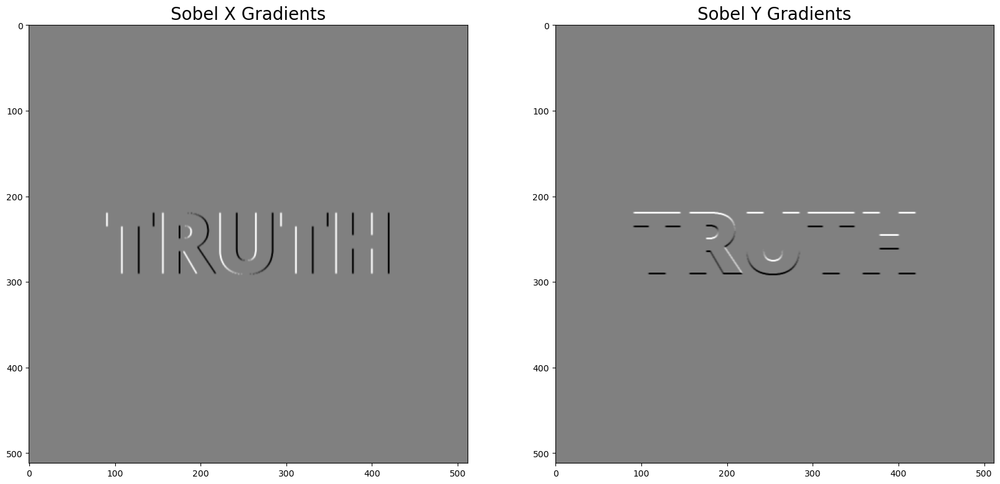

In [ ]:
# Normalize image for display
cv2.normalize(sobelx,
                dst = sobelx,
                alpha = 0,
                beta = 1,
                norm_type = cv2.NORM_MINMAX,
                dtype = cv2.CV_32F)
cv2.normalize(sobely,
                dst = sobely,
                alpha = 0,
                beta = 1,
                norm_type = cv2.NORM_MINMAX,
                dtype = cv2.CV_32F)

plt.figure(figsize=[20,10])
plt.subplot(121);plt.imshow(sobelx, cmap='gray');plt.title("Sobel X Gradients")
plt.subplot(122);plt.imshow(sobely, cmap='gray');plt.title("Sobel Y Gradients")

## <font style="color:rgb(50,120,229)">Laplacian Filter</font>

The **Laplacian** is a filter that is based on the second derivative.

In [ ]:
img = cv2.imread("sample.jpg", cv2.IMREAD_GRAYSCALE)


In [ ]:
img1 = cv2.GaussianBlur(img,(3,3),0,0)
# Applying laplacian
laplacian = cv2.Laplacian(img1, cv2.CV_32F, ksize = 3,
                            scale = 1, delta = 0)

Apply laplacian function on the image after gaussian blurring to reduce noise before calculating gradients.

In [ ]:
# Normalize results
cv2.normalize(laplacian,
                dst = laplacian,
                alpha = 0,
                beta = 1,
                norm_type = cv2.NORM_MINMAX,
                dtype = cv2.CV_32F)

array([[0.51699024, 0.5218446 , 0.526699  , ..., 0.526699  , 0.526699  ,
        0.526699  ],
       [0.5218446 , 0.52912617, 0.526699  , ..., 0.52912617, 0.52912617,
        0.526699  ],
       [0.5218446 , 0.52427185, 0.5218446 , ..., 0.5315534 , 0.5315534 ,
        0.5218446 ],
       ...,
       [0.526699  , 0.5315534 , 0.5218446 , ..., 0.5412621 , 0.5412621 ,
        0.5606796 ],
       [0.526699  , 0.5315534 , 0.5218446 , ..., 0.52427185, 0.53398055,
        0.5412621 ],
       [0.526699  , 0.5315534 , 0.5218446 , ..., 0.49271843, 0.5121359 ,
        0.51699024]], dtype=float32)

Text(0.5, 1.0, 'Laplacian')

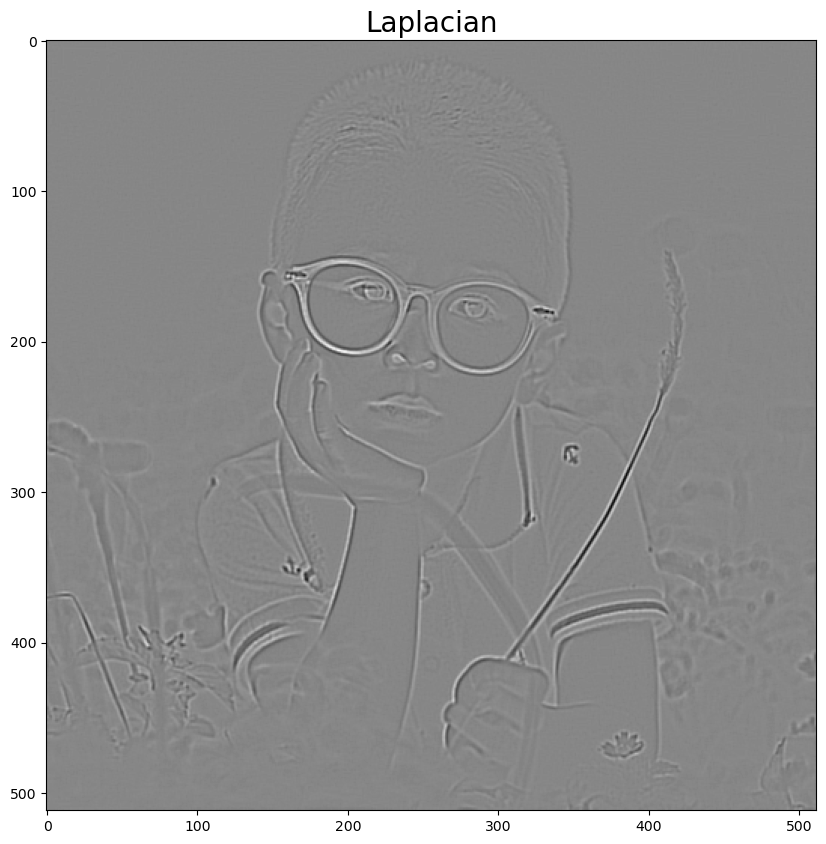

In [ ]:
plt.figure(figsize=[20,10])
plt.imshow(laplacian);plt.title("Laplacian")

### <font style="color:rgb(8,133,37)">Image Sharpening using kernel</font>
we will implement image sharpening as a simple convolution operation.

In [ ]:
image = cv2.imread("sample.jpg")


In [ ]:
#Sharpen kernel
sharpen = np.array((
    [0, -1, 0],
    [-1, 5, -1],
    [0, -1, 0]), dtype="int")


### <font style="color:rgb(8,133,37)">Apply convolution </font>

Text(0.5, 1.0, 'Sharpening Result')

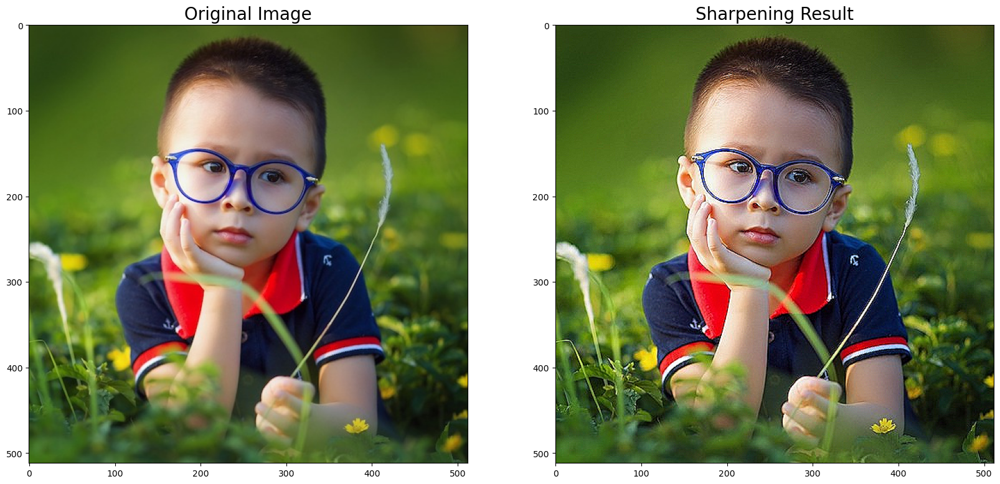

In [ ]:
# Using 2D filter by applying the sharpening kernel
sharpenOutput = cv2.filter2D(image, -1, sharpen)

plt.figure(figsize=[20,10])
plt.subplot(121);plt.imshow(image[...,::-1]);plt.title("Original Image")
plt.subplot(122);plt.imshow(sharpenOutput[...,::-1]);plt.title("Sharpening Result")

# <font style="color:rgb(50,120,229)">Thresholding</font>

In many computer vision tasks, we need to process a binary image.

A binary image consists of pixels that are either completely black ( pixel value 0 ) or completely white ( pixel value 255 ).

# <font style="color:rgb(50,120,229)">Global Thresholding</font>


In [ ]:
src = cv2.imread('threshold.png', cv2.IMREAD_GRAYSCALE)
thresh = 100
maxValue = 255

In [ ]:
th, dst_bin = cv2.threshold(src, thresh, maxValue, cv2.THRESH_BINARY)

In [ ]:
th, dst_bin_inv = cv2.threshold(src, thresh, maxValue, cv2.THRESH_BINARY_INV)

Threshold Value = 100, Max Value = 255


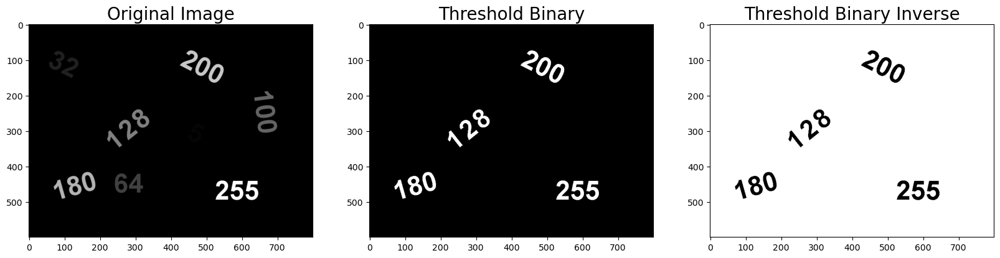

In [ ]:
print("Threshold Value = {}, Max Value = {}".format(thresh, maxValue))
plt.figure(figsize=[20,12])
plt.subplot(131);plt.imshow(src, cmap='gray', vmin=0, vmax=255);plt.title("Original Image");
plt.subplot(132);plt.imshow(dst_bin, cmap='gray', vmin=0, vmax=255);plt.title("Threshold Binary");
plt.subplot(133);plt.imshow(dst_bin_inv, cmap='gray', vmin=0, vmax=255);plt.title("Threshold Binary Inverse");

### <font style="color:rgb(50,120,230)">Lane detection example</font>

Text(0.5, 1.0, 'Thresholded')

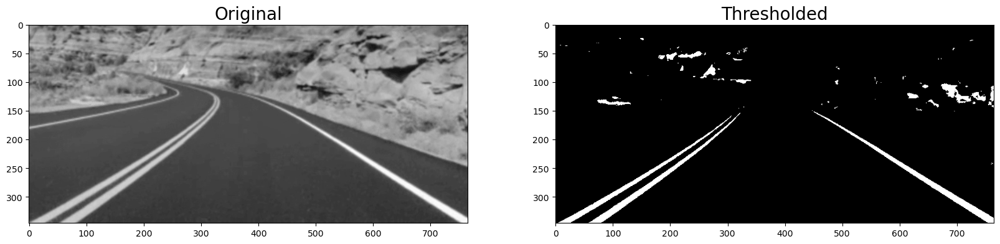

In [ ]:
img = cv2.imread('road_lanes.png', cv2.IMREAD_GRAYSCALE)

retval, img_thresh = cv2.threshold(img, 165, 255, cv2.THRESH_BINARY)

plt.figure(figsize = [20, 8])
plt.subplot(121); plt.imshow(img); plt.title('Original')
plt.subplot(122); plt.imshow(img_thresh); plt.title('Thresholded')

#  Adaptive Thresholding
Suppose you wanted to build an application that could read (decode) sheet music. In  application, one of the first steps in the processing pipeline is to isolate the important information in the image of a document (separating it from the background). This task can be accomplished with thresholding.

### <font style="color:rgb(50,120,230)">Sheet music reader</font>

Text(0.5, 1.0, 'Thresholded (adaptive)')

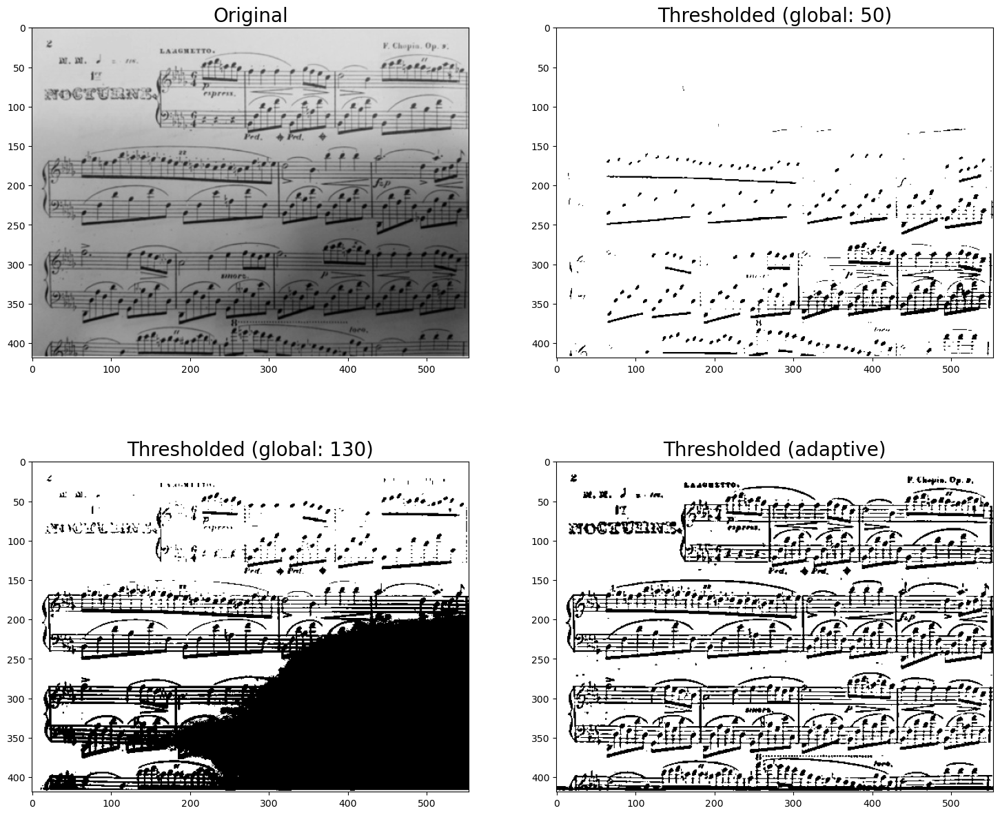

In [ ]:
#Read the original image.
img = cv2.imread('Piano_Sheet_Music.png', cv2.IMREAD_GRAYSCALE)
# Perform global thresholding.
retval, img_thresh_gbl_1 = cv2.threshold(img, 50, 255, cv2.THRESH_BINARY)
# Perform global thresholding.
retval, img_thresh_gbl_2 = cv2.threshold(img, 130, 255, cv2.THRESH_BINARY)
# Perform adaptive thresholding.
img_thresh_adp = cv2.adaptiveThreshold(img, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 13, 7)

plt.figure(figsize = [18, 15])
plt.subplot(221); plt.imshow(img);              plt.title('Original')
plt.subplot(222); plt.imshow(img_thresh_gbl_1); plt.title('Thresholded (global: 50)')
plt.subplot(223); plt.imshow(img_thresh_gbl_2); plt.title('Thresholded (global: 130)')
plt.subplot(224); plt.imshow(img_thresh_adp);   plt.title('Thresholded (adaptive)')